import numpy as np
import pandas as pd
import pickle


dfbooks = pd.read_pickle("data.pkl")

In [2]:

dfbooks.reset_index(inplace = True, drop = True) # resetting index values
dfbooks.head()
#Seperata dataframes for EDA
df_soc = dfbooks[dfbooks['discipline'] == 'sociology']
df_psy = dfbooks[dfbooks['discipline'] == 'psychology']
df_pols = dfbooks[dfbooks['discipline'] == 'politics']
df_econ = dfbooks[dfbooks['discipline'] == 'economy']
df_anth = dfbooks[dfbooks['discipline'] == 'anthropology']

In [3]:
from collections import Counter
print(Counter(dfbooks['product_title']).most_common(10))

print(Counter(dfbooks['product_title']).most_common(10))

print(Counter(df_soc['product_title']).most_common(100))
df_soc.head()

dfbooks['star_rating'].astype(str).astype(float)


[('freakonomics rogue economist explores hidden', 497), ('shut sing elites hollywood politics subverting america', 244), ('confessions economic hit man', 223), ('disappearance universe straight talk illusions past lives religion sex politics miracles forgiveness', 216), ('awaken giant immediate control mental emotional physical financial destiny', 167), ('american dynasty aristocracy fortune politics deceit house bush', 151), ('jihad political thrillers series', 147), ('new pearl harbor disturbing questions bush administration', 147), ('gods politics right gets wrong left doesnt', 138), ('rich dads cashflow quadrant rich dads guide financial freedom', 138)]
[('freakonomics rogue economist explores hidden', 497), ('shut sing elites hollywood politics subverting america', 244), ('confessions economic hit man', 223), ('disappearance universe straight talk illusions past lives religion sex politics miracles forgiveness', 216), ('awaken giant immediate control mental emotional physical fina

0        4.0
1        3.0
2        2.0
3        4.0
4        5.0
        ... 
42466    5.0
42467    5.0
42468    5.0
42469    4.0
42470    4.0
Name: star_rating, Length: 42471, dtype: float64

In [4]:
n = len(pd.unique(dfbooks['product_parent']))

print("No.of.unique books :", 
      n)

y = len(pd.unique(dfbooks['product_id']))

print("No.of.unique books :", 
      y)


No.of.unique books : 14397
No.of.unique books : 15418


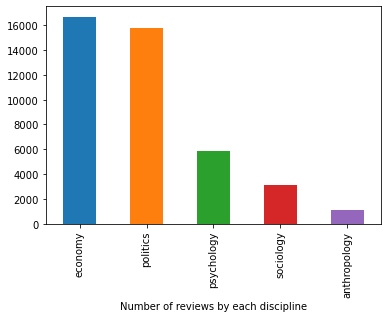

Number of reviews by each discipline : 14397


In [35]:
# Number of reviews by each discipline

# dfbooks.groupby(['discipline']).size().reset_index(name='counts') # ufak bir tablo veriyor nice

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
dfbooks['discipline'].value_counts().plot.bar(color=colors)
plt.xlabel("Number of reviews by each discipline")
plt.show()

leng = len(pd.unique(dfbooks['product_parent']))
  
print("Number of reviews by each discipline :", leng)


No.of.unique books : 14397


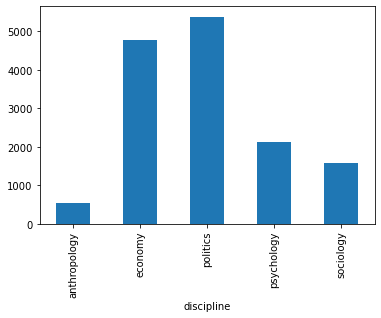

In [37]:
a = (dfbooks.groupby('discipline')['product_parent'].nunique().plot.bar())

leng = len(pd.unique(dfbooks['product_parent']))
print("No.of.unique books :", leng)

In [7]:
# a = dfbooks.groupby(['discipline', 'product_title'])['product_parent'].agg('count').reset_index()
# a

a = dfbooks.groupby('product_title')['product_parent'].agg('count').reset_index()

a


,product_title,product_parent
0,aaisas gifts study magic self studies melanesi...,1
1,abcheabchepolitical satire spanish edition,1
2,abcs financial success workbook foundation fin...,1
3,abcs mutual funds financial consultant doesnt ...,1
4,abcs political economy modern approach,4
...,...,...
14192,zondervan ministers tax financial guide zonder...,1
14193,zones peace world south america west africa co...,1
14194,zoom exceptional companies navigating road eco...,6
14195,zoroastrians iran conversion assimilation pers...,1


In [6]:
### Sorting ### 

b = dfbooks.groupby(['discipline', 'product_title']).review_body.agg([len])
b = b.reset_index()
b.sort_values(by = 'len', ascending=False)




,discipline,product_title,len
2512,economy,freakonomics rogue economist explores hidden,497
9806,politics,shut sing elites hollywood politics subverting...,244
1133,economy,confessions economic hit man,223
6421,politics,disappearance universe straight talk illusions...,216
742,economy,awaken giant immediate control mental emotiona...,167
...,...,...,...
6213,politics,crisis black sexual politics,1
6214,politics,crisis diplomacy great powers midnineteenth ce...,1
6215,politics,crisis liberal democracy straussian perspectiv...,1
6216,politics,critica las ideas politicas argentinas spanish...,1


In [15]:
c = dfbooks.groupby(['discipline', 'product_title']).product_parent.agg(['count'])

c = c.reset_index()
c.sort_values(by = 'count', ascending = False)

,discipline,product_title,count
2512,economy,freakonomics rogue economist explores hidden,497
9806,politics,shut sing elites hollywood politics subverting...,244
1133,economy,confessions economic hit man,223
6421,politics,disappearance universe straight talk illusions...,216
742,economy,awaken giant immediate control mental emotiona...,167
...,...,...,...
6213,politics,crisis black sexual politics,1
6214,politics,crisis diplomacy great powers midnineteenth ce...,1
6215,politics,crisis liberal democracy straussian perspectiv...,1
6216,politics,critica las ideas politicas argentinas spanish...,1


In [92]:
d = dfbooks.groupby('discipline')['star_rating'].agg('mean')

d


discipline
anthropology    4.235780
economy         4.121868
politics        4.093847
psychology      4.312049
sociology       4.176753
Name: star_rating, dtype: float64

In [80]:
d = df_econ.groupby('product_title')['review_body'].agg('count')

d.sort_values(ascending=False)


product_title
freakonomics rogue economist explores hidden                                                                 497
confessions economic hit man                                                                                 223
awaken giant immediate control mental emotional physical financial destiny                                   167
rich dads cashflow quadrant rich dads guide financial freedom                                                138
debtproof living complete guide living financially free                                                      109
                                                                                                            ... 
global finance financial markets modern introduction                                                           1
global finance risk real stagnation instability                                                                1
global financial                                                                  

In [83]:
d = df_soc.groupby('product_title')['review_body'].agg('count')

d.sort_values(ascending=False)


product_title
man queen science genderbending transsexualism                                            79
end racism principles multiracial society                                                 63
shes life genders                                                                         51
clep introductory sociology clep test preparation                                         48
kinder gentler military americas genderneutral fighting force win wars lisa drew books    41
                                                                                          ..
heterogender homosexuality honduras                                                        1
heroes love ambiguity eros stories gilgamesh david gender theory religion                  1
hello central gender technology culture formation telephone systems                        1
heart whiteness confronting race racism white privilege                                    1
young ideas gender identity sexuality                   

In [86]:
d = df_psy.groupby('product_title')['review_body'].agg('count')

d.sort_values(ascending=False)


product_title
influence psychology persuasion                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [87]:
d = df_anth.groupby('product_title')['review_body'].agg('count')

d.sort_values(ascending=False)


product_title
dead men tell tales strange fascinating cases forensic anthropologist             55
bone lady life forensic anthropologist                                            33
anthropologist mars seven paradoxical tales                                       29
anthropology american girl                                                        20
anthropology                                                                      14
                                                                                  ..
eye needle maori elder remembers case studies cultural anthropology                1
exotics home anthropologies american modernity women culture society               1
exotic anthropology lines                                                          1
evolutionary significance ramapithecus modules modern physical anthropology        1
zoroastrians iran conversion assimilation persistence ams studies anthropology     1
Name: review_body, Length: 542, dtype: int64

In [88]:
d = df_pols.groupby('product_title')['review_body'].agg('count')

d.sort_values(ascending=False)


product_title
shut sing elites hollywood politics subverting america                                                          244
disappearance universe straight talk illusions past lives religion sex politics miracles forgiveness            216
american dynasty aristocracy fortune politics deceit house bush                                                 151
new pearl harbor disturbing questions bush administration                                                       147
jihad political thrillers series                                                                                147
                                                                                                               ... 
japan intellectual foundations modern japanese politics phoenix book                                              1
japans international relations politics economics security sheffield centre japanese studiesroutledge series      1
japans postwar party politics                             

In [111]:
a = dfbooks.groupby('product_title').count()

a.sort_values(by=['review_body'],ascending=False)

a.iloc[100:1500,]


,product_id,product_parent,review_body,star_rating,review_date
product_title,,,,,
administration easy h,1,1,1,1,1
administration energy shortages natural gas petroleum,2,2,2,2,2
administration management,19,19,19,19,19
administration public library,2,2,2,2,2
administration publicity fundraising,1,1,1,1,1
...,...,...,...,...,...
cashflow quadrant rich dads guide financial freedom,3,3,3,3,3
cashflow reengineering optimize cashflow timeline improve financial efficiency,3,3,3,3,3
casino accounting financial management,1,1,1,1,1


In [190]:
# Make discipline index

df = dfbooks.groupby('discipline')['product_title'].apply(','.join).reset_index()

# df.set_index("discipline", inplace = True)

df.loc['sociology', 'product_title']

df


,product_title
discipline,
anthropology,nest wind adventures anthropology tropical isl...
economy,"end poverty economic possibilities time,coming..."
politics,attack messenger politicians turn media americ...
psychology,psychology proof deductive reasoning human thi...
sociology,"mapping social landscape readings sociology,he..."


In [20]:
# Document-Term Matrix for each book titles (First: Economy)

from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(stop_words='english')
data_cv = cv.fit_transform(df.product_title)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names())
data_dtm.index = df.index
data_dtm


,aaa,aaisas,aaron,abandoned,abandonment,abbreviated,abcheabchepolitical,abcs,abdullah,abe,...,zionists,zondervan,zone,zones,zoom,zoroastrian,zoroastrians,zur,zyuganov,économique
discipline,,,,,,,,,,,,,,,,,,,,,
anthropology,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
economy,0,0,0,0,0,1,0,4,0,0,...,0,14,1,1,6,0,0,0,0,1
politics,5,0,5,0,1,0,1,4,6,1,...,3,0,11,3,0,0,0,2,2,0
psychology,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
sociology,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [22]:
data_dtm.to_pickle("dtm.pkl")

In [23]:
data_dtm = pd.read_pickle('dtm.pkl')
data_dtm = data_dtm.transpose()
data_dtm.head()

discipline,anthropology,economy,politics,psychology,sociology
aaa,0,0,5,0,0
aaisas,1,0,0,0,0
aaron,0,0,5,1,0
abandoned,0,0,0,0,1
abandonment,0,0,1,0,0


In [25]:
top_dict = {}
for c in data_dtm.columns:
    top = data_dtm[c].sort_values(ascending=False).head(50)
    top_dict[c]= list(zip(top.index, top.values))

top_dict

{'anthropology': [('anthropology', 650),
  ('anthropologist', 193),
  ('anthropological', 138),
  ('forensic', 128),
  ('cultural', 121),
  ('studies', 120),
  ('tales', 85),
  ('american', 67),
  ('life', 66),
  ('series', 63),
  ('bone', 62),
  ('dead', 60),
  ('men', 59),
  ('cases', 57),
  ('tell', 55),
  ('strange', 55),
  ('fascinating', 55),
  ('human', 52),
  ('case', 48),
  ('social', 46),
  ('history', 45),
  ('anthropologists', 45),
  ('introduction', 44),
  ('culture', 43),
  ('study', 37),
  ('edition', 37),
  ('lady', 33),
  ('mars', 33),
  ('new', 31),
  ('paradoxical', 30),
  ('seven', 29),
  ('contemporary', 29),
  ('anthroposophy', 28),
  ('public', 27),
  ('cambridge', 27),
  ('man', 24),
  ('religion', 24),
  ('world', 23),
  ('theory', 23),
  ('girl', 23),
  ('issues', 22),
  ('california', 22),
  ('perspective', 20),
  ('anthropos', 20),
  ('archives', 20),
  ('medical', 20),
  ('north', 20),
  ('behavior', 19),
  ('society', 19),
  ('research', 19)],
 'economy': 

In [26]:
for discipline, top_words in top_dict.items():
    print(discipline)
    print(', '.join([word for word, count in top_words[0:14]]))
    print('---')

anthropology
anthropology, anthropologist, anthropological, forensic, cultural, studies, tales, american, life, series, bone, dead, men, cases
---
economy
financial, economics, economy, finance, economic, guide, new, money, business, edition, series, freedom, rich, economist
---
politics
politics, political, administration, american, history, guide, series, culture, economy, new, america, war, studies, bush
---
psychology
psychology, psychological, series, edition, new, trading, jungian, mind, social, guide, life, studies, spiritual, tactics
---
sociology
gender, social, sociology, racism, women, work, culture, series, race, theory, society, science, studies, american
---


In [66]:
# For WordClouds 

import numpy as np
import pandas as pd
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt
%matplotlib inline

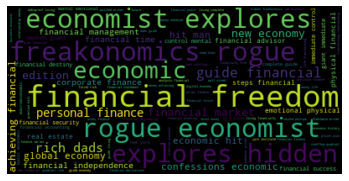

In [41]:
# Start with one review:
econ_text = df.product_title[1]

# Create and generate a word cloud image:
wordcloud = WordCloud().generate(econ_text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

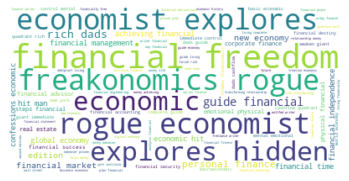

In [42]:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white",width=800, height=400).generate(econ_text)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [ ]:
# Save the image in the img folder:
wordcloud.to_file("img/first_review.png")

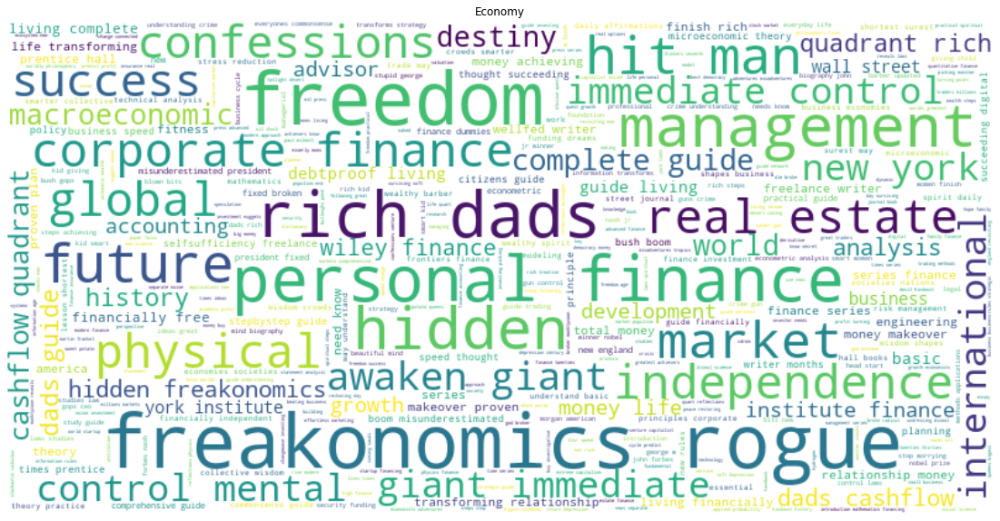

In [103]:
stopwords = set(STOPWORDS)
stopwords.update(["economist", "economy", "economic", "economics", "explores", "financial", "emotional", "edition"])

# Generate a word cloud image
wordcloud = WordCloud(max_font_size=60, max_words=500,stopwords=stopwords, background_color="white",width=800, height=400).generate(econ_text)

# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Economy')
plt.show()

wordcloud.to_file("C:/Users/ibrah/Desktop/KoçUni/2ndSpring_Donemi_Dersler/CSSM 530/python/wordclouds/econ_review.png")

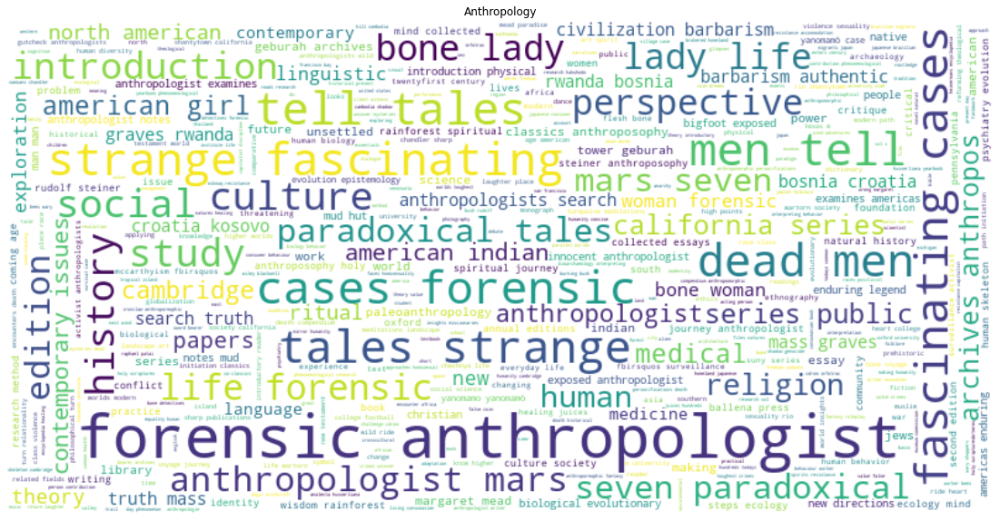

In [104]:
# Start with one review:
anth_text = df.product_title[0]

stopwords = set(STOPWORDS)
stopwords.update(["anthropology", "anthropological", "cultural", "studies"])

# Generate a word cloud image
wordcloud = WordCloud(max_font_size=50, max_words=500,stopwords=stopwords, background_color="white",width=800, height=400).generate(anth_text)

# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Anthropology')
plt.show()

wordcloud.to_file("C:/Users/ibrah/Desktop/KoçUni/2ndSpring_Donemi_Dersler/CSSM 530/python/wordclouds/anth_review.png")

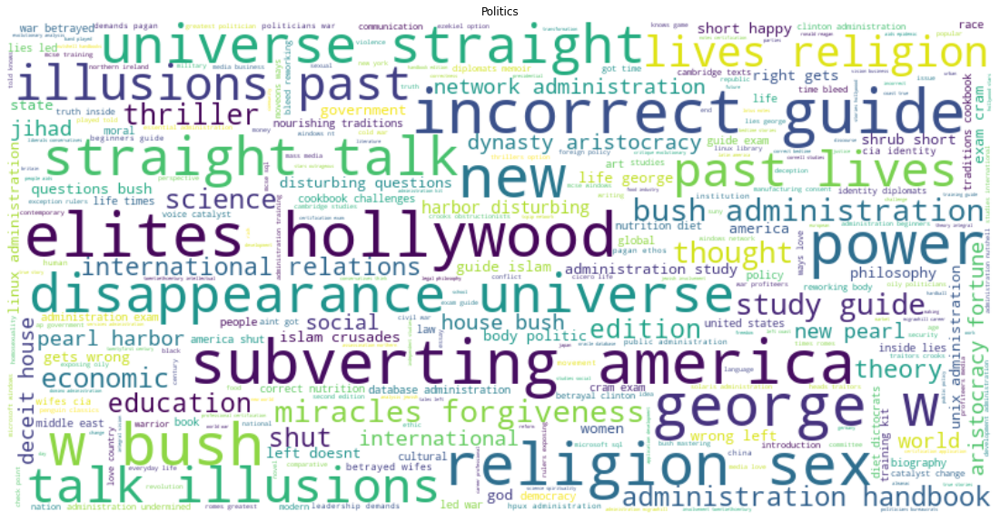

In [105]:
# Start with one review:
pols_text = df.product_title[2]

stopwords = set(STOPWORDS)
stopwords.update(["political", "politics", "political science", "culture", "history", "politically","server", "serie", "american", "society", "series", "economy", "sing"])

# Generate a word cloud image
wordcloud = WordCloud(max_font_size=50, max_words=500,stopwords=stopwords, background_color="white",width=800, height=400).generate(pols_text)

# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Politics')
plt.show()

wordcloud.to_file("C:/Users/ibrah/Desktop/KoçUni/2ndSpring_Donemi_Dersler/CSSM 530/python/wordclouds/pols_review.png")

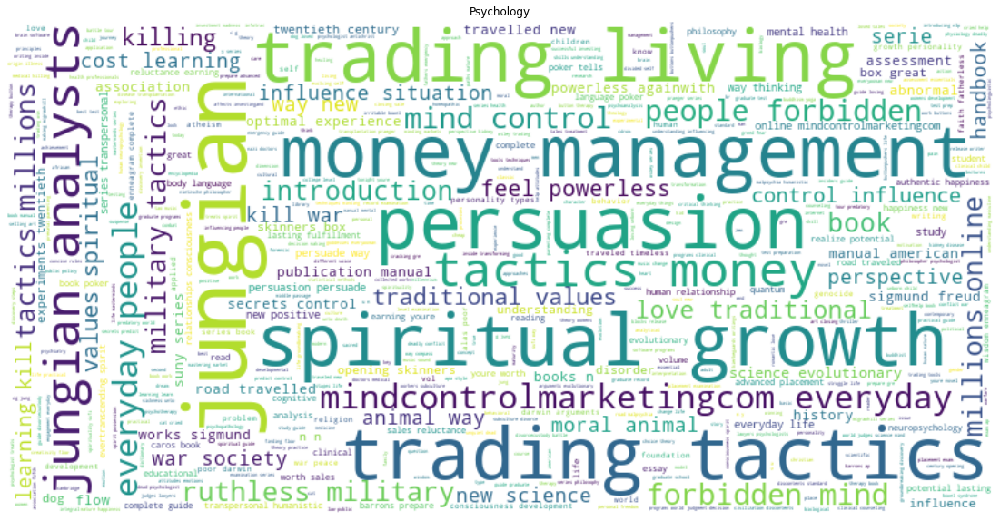

In [108]:
# Start with one review:
psy_text = df.product_title[3]

stopwords = set(STOPWORDS)
stopwords.update(["psychology", "psychological", "studies", "edition", "social"])

# Generate a word cloud image
wordcloud = WordCloud(max_font_size=70, max_words=500,stopwords=stopwords, background_color="white",width=800, height=400).generate(psy_text)

# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Psychology')
plt.show()

wordcloud.to_file("C:/Users/ibrah/Desktop/KoçUni/2ndSpring_Donemi_Dersler/CSSM 530/python/wordclouds/psy_review.png")

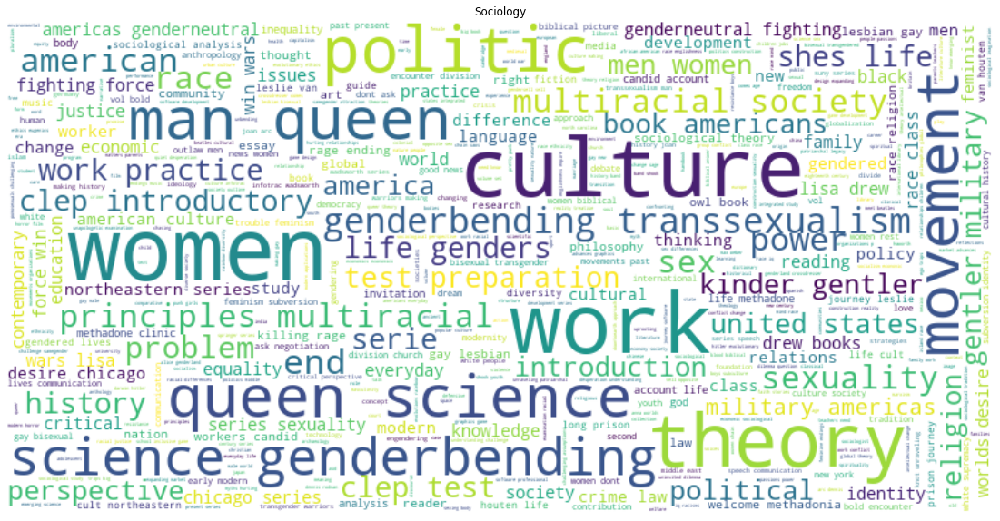

In [114]:
# Start with one review:
soc_text = df.product_title[4]

stopwords = set(STOPWORDS)
stopwords.update(["gender", "racism", "studies", "edition", "social", "sociology"])

# Generate a word cloud image
wordcloud = WordCloud(max_font_size=70, max_words=500,stopwords=stopwords, background_color="white",width=800, height=400).generate(soc_text)

# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Sociology')
plt.show()

wordcloud.to_file("C:/Users/ibrah/Desktop/KoçUni/2ndSpring_Donemi_Dersler/CSSM 530/python/wordclouds/soc_review.png")

In [53]:
dfstar = dfbooks

dfstar['star_rating'] = pd.to_numeric(dfstar['star_rating'])
dfstar['star_rating'] = dfstar['star_rating'].astype('Int64')

dfstar.dtypes



product_id        object
product_parent    object
product_title     object
review_body       object
star_rating        Int64
review_date       object
discipline        object
dtype: object

In [54]:


dfstar['star_rating'] = dfstar['star_rating'].replace([1,2,3,4,5],['low','low','middle','high','high'])

dfstar['star_rating'].unique()



array(['high', 'middle', 'low', <NA>], dtype=object)

In [55]:
dfstar = dfstar.groupby('star_rating')['review_body'].apply(','.join).reset_index()

dfstar.set_index("star_rating", inplace = True)

dfstar
# dfstar.loc['high', 'product_title']



,review_body
star_rating,
high,Review based on a cursory examination by Unive...
low,While I don't always agree with his TV analysi...
middle,ALthough he is correct that the IMF and World ...


In [56]:
contractions = {
"ain't": "am not / are not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is",
"i'd": "I had / I would",
"i'd've": "I would have",
"i'll": "I shall / I will",
"i'll've": "I shall have / I will have",
"i'm": "I am",
"i've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

# !pip install contractions
import contractions

In [57]:
import re
import string
from gensim.parsing.preprocessing import remove_stopwords
import nltk
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from bs4 import BeautifulSoup

stop=set(stopwords.words('english'))
snow = nltk.stem.SnowballStemmer('english')


def clean_text(text):
    '''Make text lowercase, remove punctuation and remove words containing numbers.'''
    text = text.lower()
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub(r"n\'t","not",text)
    text = re.sub(r"\'re","are",text)
    text = re.sub(r"\'s","is",text)
    text = re.sub(r"\'d","would",text)
    text = re.sub(r"\'ll","will",text)    
    text = re.sub(r"\'t","not",sentence)
    text = re.sub(r"\'ve","have",sentence)
    text = re.sub(r"\'m","am",sentence)
    text = remove_stopwords(text)
    text = contractions.fix(text)
    return text

preprocessed_reviews=[]


for sentence in dfstar['review_body'].values:
    sentence=re.sub(r"http\S+"," ",sentence)
    sentence=BeautifulSoup(sentence,'lxml').get_text()
    cleanr=re.compile('<.*?>')
    sentence=re.sub(cleanr,' ',sentence)
    sentence=clean_text(sentence)
    sentence=re.sub("\S\*\d\S*"," ",sentence)
    sentence=re.sub("[^A-Za-z]+"," ",sentence)
    sentence=re.sub(r'[?|!|\'|"|#]',r' ',sentence)
    sentence=re.sub(r'[.|,|)|(|\|/]',r' ',sentence)
    sentence = sentence.lower()
    preprocessed_reviews.append(sentence.strip())


In [58]:

print(preprocessed_reviews[1:100])

['while i do not agree tv analysis i enjoy mr crawford s commentaries his book however surprisingly shallow summed chapter footnotes i did not realize intentional misquoting thomas jefferson page easy catch footnote provides actual quote foreshadowing paraphrasing come almost sources media criticizes yes media astute critical power anywhere is not corporatized vilified reporters organizations wimped out ok yes and since crawford journalist claims inside view goes on obligated standards poses went on explain manipulation allowed it tom fenton book bad news thorough job explaining links money reporting providing context media manipulation journalistic reticence crawford gives specific examples manipulation does not provide motive context trite politicians manipulate media look better powerful therein lies point media powerful needs manipulated powerful hold own why has not media held are not people demanding real public discussion what messenger message supposed deliver crawford says peo

In [79]:
# dfstar['review_body'] = preprocessed_reviews


# del dfstar["processed"]

dfstar


,review_body
star_rating,
high,review based cursory examination university ph...
low,while i do not agree tv analysis i enjoy mr cr...
middle,although correct imf world bank play role advo...


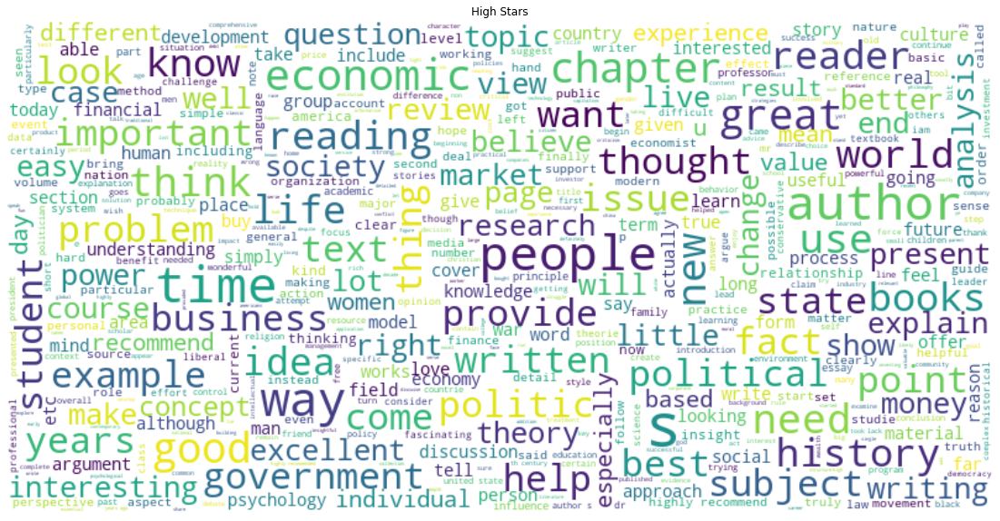

In [80]:
# Start with one review:
star_text = dfstar.review_body[0]

stopwords = set(STOPWORDS)
stopwords.update(["racism", "one", "understand", "year", "work", "study", "american", "book", "read", "information"])

# Generate a word cloud image
wordcloud = WordCloud(max_font_size=50, max_words=500,stopwords=stopwords, background_color="white",width=800, height=400).generate(star_text)

# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('High Stars')
plt.show()

wordcloud.to_file("C:/Users/ibrah/Desktop/KoçUni/2ndSpring_Donemi_Dersler/CSSM 530/python/wordclouds/star_review.png")

Exploratory with other than titles

In [ ]:
# Imports
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px
# Product Scores
fig = px.histogram(df, x="Score")
fig.update_traces(marker_color="turquoise",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Score')
fig.show()

In [3]:
import numpy as np
import pandas as pd
import pickle
dfbooks = pd.read_pickle("data.pkl")

# frame["DataFrame Column"]= frame["DataFrame Column"].apply(str)

In [12]:
# dfbooks.dtypes


# dfbooks['review_body'] = dfbooks['review_body'].astype(str)

dfbooks.dtypes


product_id        object
product_parent    object
product_title     object
review_body       object
star_rating       object
review_date       object
discipline        object
dtype: object